0001147866, Davide Sonno, davide.sonno@studio.unibo.it \
0001125001, Davide Crociati, davide.crociati2@studio.unibo.it \
0001142939, Lorenzo Pellegrino, lorenzo.pellegrino2@studio.unibo.it

# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [4]:
try:
    from google.colab import drive
    drive.mount('/content/drive')

    !cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
    !unzip dataset.zip
except ModuleNotFoundError:
    pass

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

# ASSIGNMENT:

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

models_path="dataset/models/"
scenes_path="dataset/scenes/"

products_A={i:f"{models_path}ref{i}.png" for i in range(1,15)}
products_B={i:f"{models_path}ref{i}.png" for i in range(15,28)}

scenes_A={i:f"{scenes_path}scene{i}.png" for i in range(1,6)}
scenes_B={i:f"{scenes_path}scene{i}.png" for i in range(6,13)}

## TRACK A

### Introduction

The approach to solve the first task involves several steps:

- Feature Extraction: First, apply the Scale-Invariant Feature Transform (SIFT) algorithm to both product images and scene images. Prior to this, denoise the scene images to enhance feature detection accuracy.

- Feature Matching: Identify and filter matches between the detected features in the product and scene images.

- Homography Estimation: Compute a homography between the scene and product images to accurately map the product's location within the scene, allowing the extraction of bounding boxes around the detected instances.

- Instance Filtering: To ensure the reliability of the detected instances, filter out spurious detections by checking if any instances are concentric. Retain only the instance with the largest number of feature matches when multiple concentric instances are identified.

Let' start by preparing a method to easily apply filters to an image.

In [6]:
def denoise_image(image, filters):
    '''
    Apply denoising filters to the input image.

    Parameters:
    image (array_like): The input image to be denoised.
    filters (list of dict): A list of dictionaries, each representing a denoising filter to be applied.
        Each dictionary should have the following keys:
            - name (str): The name of the filter.
            - n_iter (int): The number of iterations to apply the filter.
            - params (dict): A dictionary containing parameters specific to the filter.

    Returns:
    array_like: The denoised image.

    Example:
    >>> denoised_image = denoise_image(input_image, [
    >>>     {"name": "mean", "n_iter": 1, "params": {"ksize": 7}},
    >>>     {"name": "median", "n_iter": 1, "params": {"ksize": 5}},
    >>>     {"name": "bilateral", "n_iter": 1, "params": {"d": 3, "sigmaColor": 2, "sigmaSpace": 1.5}},
    >>>     {"name": "gaussian", "n_iter": 1, "params": {"sigmaX": 2}},
    >>>     {"name": "non_local_means", "n_iter": 1, "params": {"templateWindowSize": 5, "searchWindowSize": 21, "h": 3, "hColor": 20}},
    >>>     {"name": "canny", "n_iter": 1, "params": {"threshold1": 5, "threshold2": 21}},
    >>>     {"name": "sharpen", "n_iter": 1, "params": {}}, # 3x3 kernel
    >>>     {"name": "emboss", "n_iter": 1, "params": {}}   # 3x3 kernel
    >>> ])
    '''
    for filter in filters:
        for _ in range(filter['n_iter']):
            match filter['name']:
                case "mean":
                    '''
                    {"ksize" : 15}
                    '''
                    k_size = filter['params']['ksize']
                    mean_kernel = np.ones([k_size, k_size])/(k_size**2)
                    image = cv2.filter2D(image, -1, mean_kernel)
                case "median":
                    '''
                    {"ksize" : 11}
                    '''
                    image = cv2.medianBlur(image, **filter['params'])
                case "bilateral":
                    '''
                    {"d" : 3,
                    "sigmaColor" : 2,
                    "sigmaSpace" : 1.5}
                    '''
                    image = cv2.bilateralFilter(image, **filter['params'])
                case 'gaussian':
                    '''
                    {"sigmaX" : 2}
                    '''
                    sigmaX = filter['params']['sigmaX']
                    ksize = 2*int(np.ceil(3*sigmaX)) + 1
                    image = cv2.GaussianBlur(image, (ksize, ksize), sigmaX)
                case 'non_local_means':
                    '''
                    {'templateWindowSize':5,"searchWindowSize":21, "h":3, "hColor": 20}
                    '''
                    image = cv2.fastNlMeansDenoisingColored(image, **filter['params'])
                case 'canny':
                    '''
                    {'threshold1':5,"threshold2":21}
                    '''
                    image = cv2.Canny(image, **filter['params'])
                case 'sharpen':
                    kernel = np.array([[0, -1, 0],
                                       [-1, 5, -1],
                                       [0, -1, 0]])
                    image = cv2.filter2D(image, -1, kernel=kernel)
                case 'emboss':
                    kernel = np.array([[-2, -1, 0],
                                       [-1, 1, 1],
                                       [0, 1, 2]])
                    image = cv2.filter2D(image, -1, kernel=kernel)
                case _: pass
    return image

### SIFT on products

First of all we apply SIFT on the products. We will store the found keypoints and the relative descriptors.
We are also going to store the read images, just to not read them again.  

_We can use SHOW_KEYPOINTS to print/hide the plots after applying SIFT_.

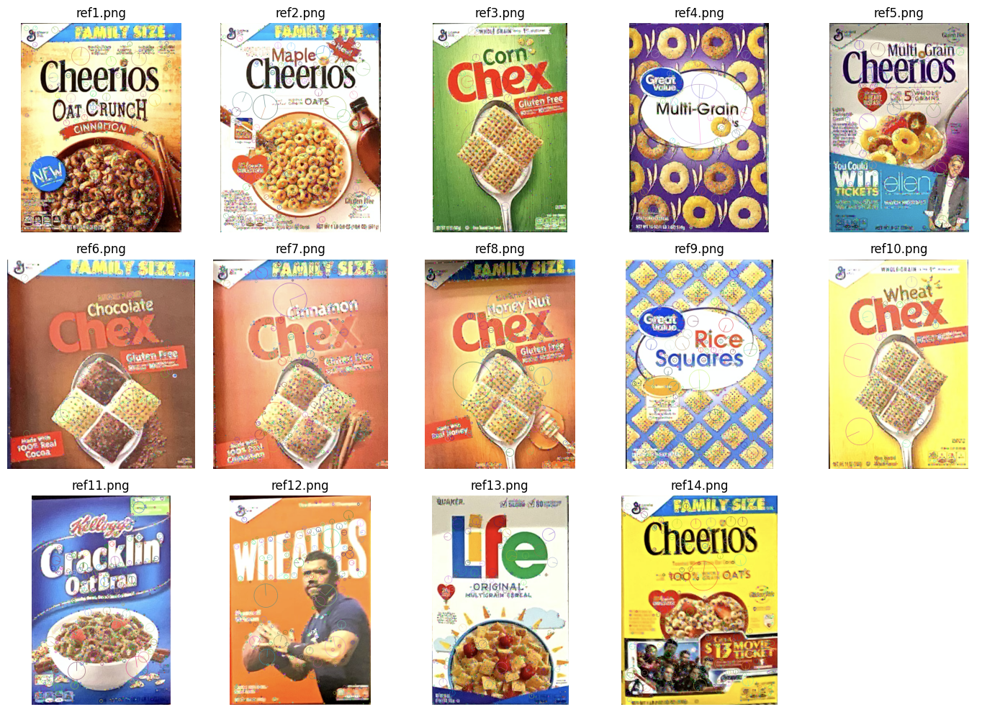

In [7]:
SHOW_KEYPOINTS = True

# dictionary to store keypoints, descriptor and shape of a product, used for the homography
product_info_A = {}
# dictionary to store the read images
read_products_A = {}

if SHOW_KEYPOINTS:
    fig, axes = plt.subplots(3, 5, figsize=(14, 10))
    axes = axes.flatten()

for i, product in enumerate(products_A):
    image = cv2.imread(products_A[product])
    read_products_A[product] = image
    sift = cv2.SIFT_create()
    keypoints = sift.detect(image)
    keypoints,des=sift.compute(image, keypoints)
    product_info_A[product]={
        'keypoints':list(keypoints),
        'descriptors':des,
        'shape':image.shape[:-1],
    }
    if SHOW_KEYPOINTS:
        img_kp = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
        axes[i].axis('off')
        axes[i].set_title(products_A[product][len(models_path):])
        if i == len(products_A)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

if SHOW_KEYPOINTS:
    plt.tight_layout()
    plt.show()

### Denoising and SIFT on scenes images

After some tests we found that the median filters were the best for denoising the given images, in particular this combination:

In [8]:
settings_A = [
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 5}
     },
    {'name': "median",
        "n_iter": 1,
        "params": {"ksize": 7}
     }
]

With the filters above, we try to denoise images and then compute SIFT. Once again we are going to store the results of SIFT and the read scenes.  
For the scenes we store both the noisy and the denoised versions.

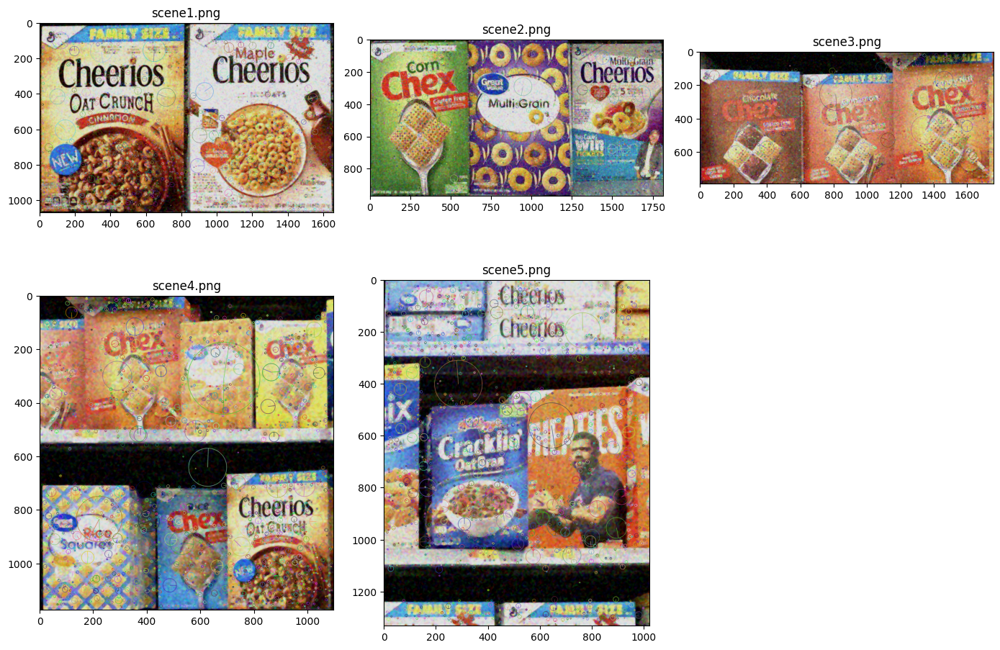

In [9]:
SHOW_KEYPOINTS = True
SHOW_FILTERED = True

if SHOW_KEYPOINTS or SHOW_FILTERED:
    fig, axes = plt.subplots(2, 3, figsize=(14, 10))
    axes = axes.flatten()

scene_info_A = {}
read_scenes_A = {}
read_scenes_noisy_A = {}
for i, scene in enumerate(scenes_A):
    image = cv2.imread(scenes_A[scene])
    read_scenes_noisy_A[scene] = image
    sift = cv2.SIFT_create()
    filtered_image = denoise_image(image, settings_A)
    keypoints = sift.detect(filtered_image)
    read_scenes_A[scene]=filtered_image
    keypoints,descriptors=sift.compute(filtered_image, keypoints)
    scene_info_A[scene]={
        'keypoints':list(keypoints),
        'descriptors':descriptors,
        'shape':image.shape[:-1]
    }
    if SHOW_KEYPOINTS or SHOW_FILTERED:
        printable_image = image
        if SHOW_FILTERED:
            printable_image = filtered_image
        if SHOW_KEYPOINTS:
            printable_image = cv2.drawKeypoints(printable_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(printable_image, cv2.COLOR_BGR2RGB))
        axes[i].set_title(scenes_A[scene][len(scenes_path):])
        # remove unused subplots
        if i == len(scenes_A)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

if SHOW_KEYPOINTS or SHOW_FILTERED:
    plt.tight_layout()
    plt.show()

### Computation of matches and homographies between scenes and products instances

The method from _openCV_ to compute the homography returns the points of the polygon found. We use that points to extract the bouding box of that product, in terms of center position, width and height.  

These values are computed assuming that the points returned form a rectangle with no rotation. This is a bit vague but most of the times the points are already precisely forming  rectangle. If not that's because the homography is a bit scuffed, but that product fill be removed later.

In [10]:
def diagonal(points, point2=None):
    if point2:
        return np.sqrt(np.abs((points[0]-point2[0])**2+(points[1]-point2[1])**2))
    return np.sqrt(np.abs(np.sum(np.subtract(points[:1, :], points[1:, :])**2)))


def get_geometry(corners):
    '''
    returns position(x,y), width, height.

    The center position is computed as the mean value of the x-coord and y-coord.
    Width and height using point-distance, knowing that the order of the points
    returned by the homography method is always the same (TL,BL,BR,TR)
    '''
    return {'position': tuple(np.round((np.sum(corners, axis=0)/4)[0], 0).astype(int)),
            'width': int(f'{diagonal(corners[1:3,:]):0.0f}'),
            'height': int(f'{diagonal(corners[:2,:]):0.0f}')
            }

We are now computing the matches between scenes and products. We will store the results in a dictionary, containing for every scene another dictionary with the position of each found product. This nested dictionary has the keys _match_count_, the number of keypoints used to compute the homography, _geometry_ storing position and size of the product and also an additional key named _flag_ that will be later set to false whenever a product isn't a good result. 
 
The try-except block is there because of some errors that can occur with the _openCV.findHomography_ method. In that case the analyzed product is not in the image, so we don't have to worry about that.

In [11]:
# resulting matches/positions will be stored here
results_A = {}
DISTANCES_RATIO = 0.7
for i, scene in enumerate(scene_info_A, 1):
    results_A[i] = {}
    for j, product in enumerate(product_info_A, 1):
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(product_info_A[product]['descriptors'], scene_info_A[scene]['descriptors'], k=2)
        good = []
        for m, n in matches:
            if m.distance < DISTANCES_RATIO*n.distance:
                good.append(m)
                
        try: # to avoid homography errors happening with fewer than 4 points
            src_pts = np.float32([product_info_A[product]['keypoints'][m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
            dst_pts = np.float32([scene_info_A[scene]['keypoints'][m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            matchesMask = mask.ravel().tolist()

            h, w = read_products_A[product].shape[:2]
            pts = np.float32([[0, 0], [0, h-1], [w-1, h-1],[w-1, 0]]).reshape(-1, 1, 2)

            dst = np.int32(cv2.perspectiveTransform(pts, M))

            results_A[i][j] = {
                'match_count': np.sum(matchesMask), # the mask is used to pin the points used for the homography
                'geometry': get_geometry(dst), # returns the center position, width and height of the bounding box
                'flag':True # used later to check wheter or not to display the product
            }
        except cv2.error:
            print('cv2 error',f'scene {i} prod {j}')
            pass

cv2 error scene 1 prod 12


### Results

To understand what results we got from the previous steps let's inspect graphically our instances.  
We are going to use _cv2.polylines_ to draw the bounding box, so we need to compute the angles from the geometry dictionary:

In [12]:
def get_angles(geometry_dict):
    '''
    return the angles with shape (4,1,2)
    '''
    center_x, center_y = geometry_dict['position']
    width = geometry_dict['width']
    height = geometry_dict['height']
    
    top_left = np.array([center_x - width/2, center_y + height/2])
    bottom_left = np.array([center_x - width/2, center_y - height/2])
    bottom_right = np.array([center_x + width/2, center_y - height/2])
    top_right = np.array([center_x + width/2, center_y + height/2])
    corners = np.array([top_left, bottom_left, bottom_right, top_right]).reshape(4, 1, 2)
    
    return corners

In [13]:
def plot_SI_bounding_boxes(results,colorRange=100,drawCircles=True,useNoisyScenes=True):
    fig, axes = plt.subplots(2, 3, figsize=(14, 7))
    axes = axes.flatten()
    for i, scene in enumerate(results):
        image=read_scenes_A[scene].copy()
        if useNoisyScenes:
            image=read_scenes_noisy_A[scene].copy()
        prods=len([true_prod for true_prod in results[scene].values() if true_prod['flag']])
        for c,product in enumerate(results[scene]):
            if results[scene][product]['flag']:
                points = get_angles(results[scene][product]['geometry'])
                color=[0,255-colorRange+colorRange*(prods-(c+1))/prods,0]
                image = cv2.polylines(image, [np.int32(points)], True, color, 20, cv2.LINE_AA)
                text=f'{product}'
                px,py=results[scene][product]['geometry']['position']
                if drawCircles:
                    image=cv2.circle(image,(px,py),50,color,-1)
                    if product>9:
                        image=cv2.circle(image,(px+50,py),50,color,-1)
                    text_color=[255]*3
                else: 
                    text_color=0
                px-=30
                py+=30
                image=cv2.putText(image,text,(px,py),cv2.FONT_HERSHEY_PLAIN,6,text_color,7)
        axes[i].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
        axes[i].axis('off')
        axes[i].set_title(f'Scene {scene}')
        if i == len(scenes_A)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

    plt.tight_layout()
    plt.show()

Our instances look like this:

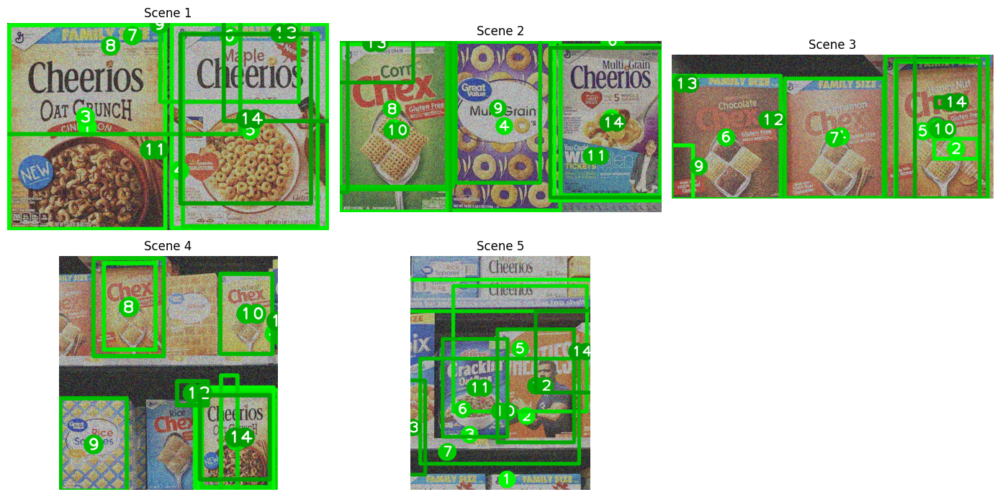

In [14]:
plot_SI_bounding_boxes(results_A.copy())

#### Auxiliar mehods used to improve the results

Most of the instances that we have are referring to the same product, so we have to find some heuristic to only keep the correct product.  
First of all some homography will result in bounding box outside the scene image, so we remove them, using the following methods:  

In [15]:
def inside(center, image_shape):  # center is (x;y), shape is (rows,columns)
    '''
    used to detect if a point (the center of the bounding box) is inside the scene image
    '''
    return (
        center[0] >= 0 and
        center[0] < image_shape[1] and
        center[1] >= 0 and
        center[1] < image_shape[0]
    )


def remove_outside_products_SI(results):
    for scene in results:
        for product in results[scene]:
            center=results[scene][product]['geometry']['position']
            if not inside(center,read_scenes_A[scene].shape):
                results[scene][product]['flag']=False

In [16]:
remove_outside_products_SI(results_A)

At this point we should have removed some instances. Let's inspect what we are left with:

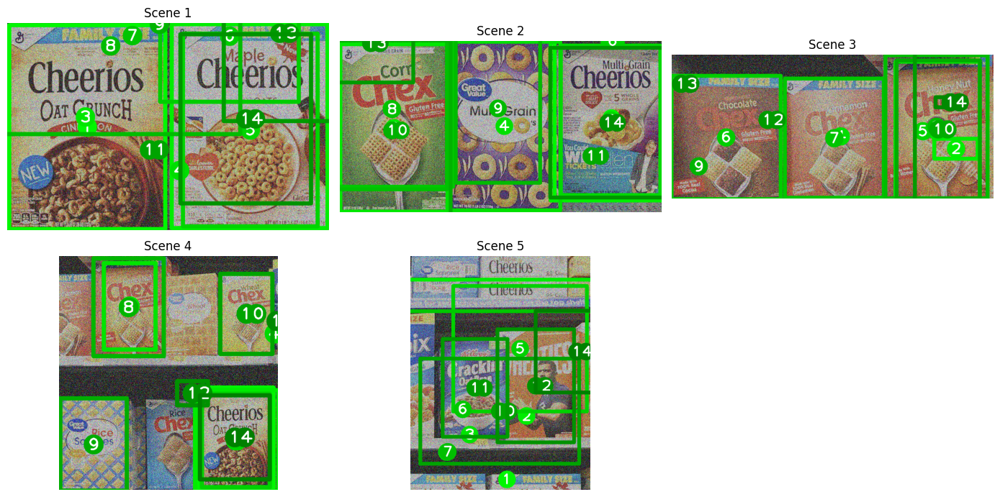

In [17]:
plot_SI_bounding_boxes(results_A.copy())

We need something to detect if two bounding boxes insists on the same area. We simply check if the center of a bounding box lands inside another box:

In [18]:
def check_boundings(point, geometry):
    '''
    checks wheter or not a point is inside a bounding box (computed using `get_geometry`)
    '''
    try:
        pointX, pointY = point
        centerX, centerY = geometry['position']
        sizeX = geometry['width']
        sizeY = geometry['height']
        return (
            centerX-sizeX/2 <= pointX 
            and pointX <= centerX+sizeX/2 
            and centerY-sizeY/2 <= pointY 
            and pointY <= centerY+sizeY/2
            )
    except ValueError:
        return False

Whenever we detect two overlapping products we use the previously saved match count and we only keep the product with the bigger amount of found matches.

In [19]:
def remove_overlapping_products_match_count(results, method='overlapping_center', show_concentric_texts=False):
    '''
    Single Instance:
        for every couple of products in the same scene, if two products happen
      to be in the same region, only keep the one with the most matches
    '''
    for scene in results.keys():
        keys = list(results[scene].keys())
        for product1 in keys:
            for product2 in [k for k in keys if k != product1]:
                # this match clause was used to test multiple check methods
                # but we are only left with the working one
                match method:
                    case 'overlapping_center':
                        # tuple (x,y)
                        point = results[scene][product1]["geometry"]["position"]
                        if check_boundings(point, results[scene][product2]["geometry"]):
                            if show_concentric_texts:
                                print(
                                    f'scene {scene}: products {product1} and {product2} are found to be concentric')
                            if results[scene][product1]["match_count"] > results[scene][product2]["match_count"]:
                                # when choosing what instance to remove, we only remove it if the other one isn't removed
                                # this is a safe measure whenever two instances would have the same number of matches
                                # and both of them would be removed
                                if results[scene][product1]['flag']:
                                    results[scene][product2]["flag"] = False
                            else:
                                if results[scene][product2]["flag"]:
                                    results[scene][product1]["flag"] = False
                    case _: pass

#### Printing methods

In [20]:
def display_settings(settings, match_count=None, value=None):
    '''
    print used filters and eventually additional settings
    '''
    aux = [filter for filter in settings if ('matching_settings' in filter.keys() or filter['n_iter'] > 0)]
    print('Denoise settings:')
    display(aux)
    if value:
        print(f'tollerance on template matcher: {value}')
    if match_count:
        print(f'min_match:{match_count}')


def print_single_instances(results: dict, min_match, return_dict=False):
    # variables used to correctly format the ouput string
    max_product_len = max(len(str(product))for scene in results for product in results[scene].keys())
    max_match_len = max(len(str(results[scene][product]["match_count"]))for scene in results for product in results[scene])
    max_x_len = max(len(str(results[scene][product]["geometry"]["position"][0])) for scene in results for product in results[scene] if inside(
        results[scene][product]['geometry']['position'], read_scenes_A[scene].shape))
    max_y_len = max(len(str(results[scene][product]["geometry"]["position"][1])) for scene in results for product in results[scene] if inside(
        results[scene][product]['geometry']['position'], read_scenes_A[scene].shape))
    max_width_len = max(len(str(results[scene][product]["geometry"]["width"]))for scene in results for product in results[scene])
    max_height_len = max(len(str(results[scene][product]["geometry"]["height"]))for scene in results for product in results[scene])

    if return_dict:
        results_dict = {}

    for scene in results.keys():
        if return_dict:
            results_dict[scene] = {}
        print(f'Scene {scene}:')
        for product in results[scene].keys():
            if (  # the product must have a certain amount of matches
                    results[scene][product]['match_count'] >= min_match and
                # set to false in `remove_overlapping_products_match_count` if refs refers to the same product (they both think to be the same product)
                    results[scene][product]['flag']):
                if return_dict:
                    results_dict[scene][product] = results[scene][product]
                    
                print(f"\tProduct {str(product)+',':<{max_product_len+1}}"
                      # + f" matches: {str(results[scene][product]['match_count'])+',':<{max_match_len+1}}"
                      + f" {{position: ({str(results[scene][product]['geometry']['position'][0])+',':<{max_x_len+1}}"
                      + f" {str(results[scene][product]['geometry']['position'][1])+'),':<{max_y_len}}"
                      + f" width: {str(results[scene][product]['geometry']['width'])+',':<{max_width_len}}"
                      + f" height: {results[scene][product]['geometry']['height']:<{max_height_len-1}}}}")
    if return_dict:
        return results_dict

### Final Results

We use a constant _MIN_MATCH_COUNT_ to control the minimum number of matches that a product must have in order to be kept;

In [21]:
MIN_MATCH_COUNT = 10

We can finally check our results using the defined heuristic:

In [22]:
# print the filters used and the minimum match count
display_settings(settings_A,match_count=MIN_MATCH_COUNT)

# remove overlapping products and display the results
remove_overlapping_products_match_count(results_A)
final_results_A=print_single_instances(results_A,min_match=MIN_MATCH_COUNT,return_dict=True)

Denoise settings:


[{'name': 'median', 'n_iter': 2, 'params': {'ksize': 3}},
 {'name': 'median', 'n_iter': 2, 'params': {'ksize': 5}},
 {'name': 'median', 'n_iter': 1, 'params': {'ksize': 7}}]

min_match:10
Scene 1:
	Product 1,  {position: (412,  538), width: 803,  height: 1048}
	Product 2,  {position: (1247, 533), width: 802,  height: 1048}
Scene 2:
	Product 3,  {position: (305,  493), width: 604,  height: 942 }
	Product 4,  {position: (928,  483), width: 633,  height: 949 }
	Product 5,  {position: (1528, 450), width: 561,  height: 842 }
Scene 3:
	Product 6,  {position: (297,  456), width: 597,  height: 674 }
	Product 7,  {position: (888,  460), width: 540,  height: 651 }
	Product 8,  {position: (1446, 398), width: 558,  height: 781 }
Scene 4:
	Product 1,  {position: (887,  913), width: 375,  height: 505 }
	Product 8,  {position: (348,  257), width: 352,  height: 491 }
	Product 9,  {position: (173,  946), width: 333,  height: 464 }
	Product 10, {position: (938,  290), width: 261,  height: 402 }
Scene 5:
	Product 11, {position: (367,  751), width: 368,  height: 557 }
	Product 12, {position: (712,  739), width: 435,  height: 644 }


#### Draw bounding boxes
We can now observe graphically the products found:

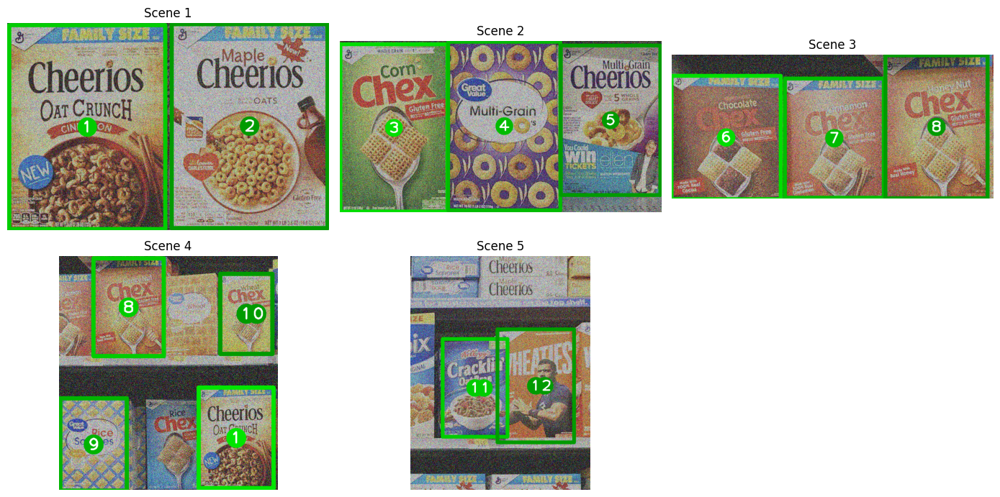

In [23]:
plot_SI_bounding_boxes(final_results_A)

## TRACK B

### Introduction

Track B of the assignment requires a little more attention since a product can be present multiple times.

Initially we tried to use something similar to track A, based on the number of matches. Unfortunately SIFT couldn't produce more matches with the actual product rather than a similar one (i.e even if the product was n.27, SIFT would detect n.26 with an higer number of matches).  

Leaving apart the idea of comparing the number of matches, we tried comparing the mean value of the colors of the image. To do so we used the original _ref_ images and the denoised scenes in the bounding box of where the product was found. The results were not great, so we tried to apply some normal noise to the _ref_ and then compare it with the bounding box in the noisy scene. Still no encouraging results.  

The thing we had to do was to then consider the channels of the images separately, because some images would only differ in one channel.  

We can notice that products 18, 26 and 27, for example, have identical shapes and only a small difference in colors.  

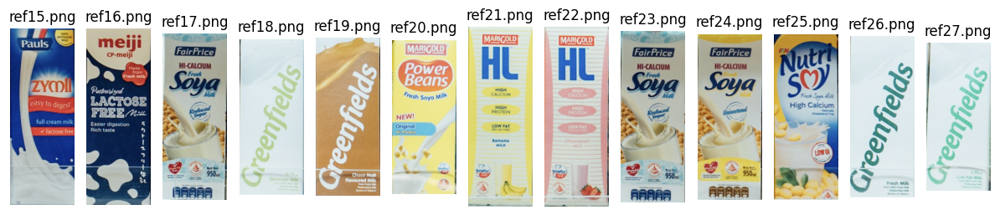

In [24]:
read_products_B={}

fig, axes = plt.subplots(1, 13, figsize=(12, 3))
axes = axes.flatten()

for i, product in enumerate(products_B):
    image = cv2.imread(products_B[product])
    read_products_B[product]=image
    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].axis('off')
    axes[i].set_title(str(products_B[product][len(models_path):]))
    if i==len(products_B)-1:
        for ax in axes[i+1:]:
            ax.axis('off')


plt.tight_layout()
plt.show()

We are going to use color histograms, and in particular the differences between them, inspecting the distribution over the color channels of the images. Let's plot a couple of them to check the differences:

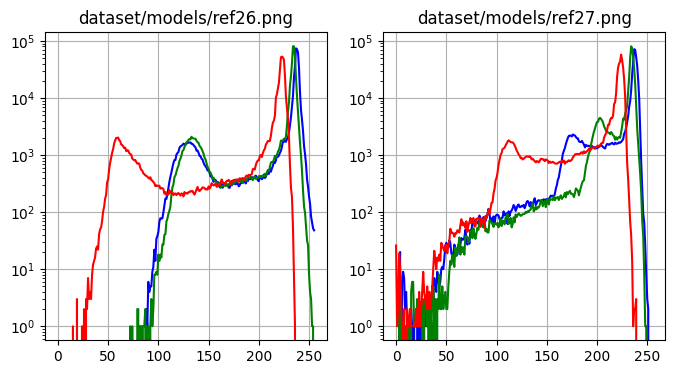

In [25]:
plt.figure(figsize=(8,4))
plt.subplot(121)

first_product=26
chans = cv2.split(read_products_B[first_product])
colors = ("b", "g", "r")
for (chan, color) in zip(chans, colors):
    hist = cv2.calcHist([chan], [0], None, [256], [0,256])
    plt.plot(hist, color=color)
    plt.yscale('log')
    plt.grid()
    plt.title(f'{products_B[first_product]}')
    
plt.subplot(122)

second_product=27
chans = cv2.split(read_products_B[second_product])
for (chan, color) in zip(chans, colors):
    hist = cv2.calcHist([chan], [0], None, [256], [0,256])
    plt.plot(hist, color=color)
    plt.yscale('log')
    plt.grid()
    plt.title(f'{products_B[second_product]}')

Initially we tried to use SIFT similarly to track A. The main problem is that due to the noise of the images some product would never be found only using SIFT keypoints, namely product 18. A lot of different filters were tried with poor results due to the low number of matches. 

We decided to use the Generalized Hough Transform based on SIFT.

### Offline Phase of the GHT

In [26]:
# sift_settings={
#     'nOctaveLayers':12,
#     'contrastThreshold':0.04,
#     'sigma':1.1,
# }

To get more keypoints we also decided to modify the SIFT settings increasing the number of layers in an octave and decreasing the contrast threshold and the variance.

In [27]:
sift_settings={
    'nOctaveLayers':12,
    'contrastThreshold':0.03,
    'sigma':1.2,
}

Here we do the offline phase of the GHT:
- detect features for each feature point: position, canonical orientation, scale and descriptor 
- compute the barycenter and build the star model

    $F = \{F_1,...,F_n\}, F_i=(P_i, \phi_{i}, S_i, D_i)$

    $P_C = 1/N \sum_{i=1}^{N} P_i, V_i = P_C - P_i$
- add $V_i$ the joining vector $\forall F_i \in F, F_i=(P_i, \phi_{i}, S_i, D_i, V_i)$

In [28]:
def get_barycenter(points):
    return np.mean([p.pt for p in points],axis=0)


def joining(p,b):
    return b-p


def create_star_model(keypoints):
    '''
    
    '''
    barycenter=get_barycenter(keypoints)
    V=[]
    for k in keypoints:
        V.append(joining(k.pt,barycenter))
    return tuple(V),barycenter

In [29]:
product_info_B = {}
SHOW_KEYPOINTS=False
if SHOW_KEYPOINTS:
    fig, axes = plt.subplots(3, 5, figsize=(14, 20))
    axes = axes.flatten()
sift=None
for i, product in enumerate(products_B):
    image = read_products_B[product]
    sift = cv2.SIFT_create(**sift_settings)
    keypoints = sift.detect(image)
    keypoints,des=sift.compute(image, keypoints)
    V,barycenter=create_star_model(keypoints)
    product_info_B[product]={
        'keypoints':list(keypoints),
        'descriptors':des,
        'shape':image.shape[:-1],
        'vectors':V,
        'barycenter':barycenter
    }
    if SHOW_KEYPOINTS:
        img_kp = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
        axes[i].axis('off')
        axes[i].set_title(str(products_B[product][len(models_path):])+f'\n{len(keypoints)} keypoints')
        if i==len(products_B)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

if SHOW_KEYPOINTS:
    plt.tight_layout()
    plt.show()

### Denoising of the scenes

First of all let's check the histograms of some scenes.

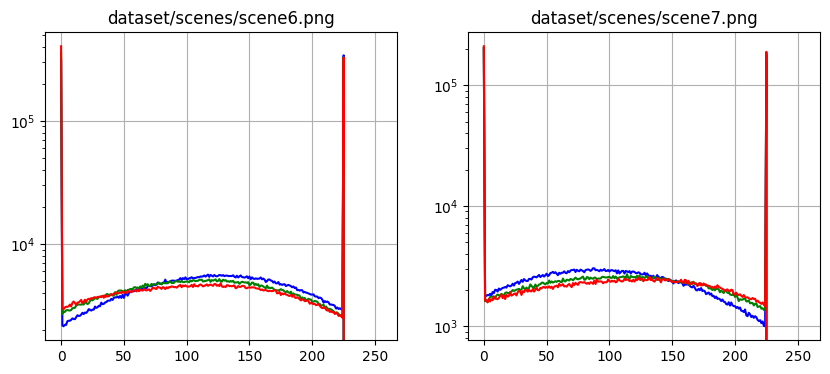

In [30]:
plt.figure(figsize=(10,4))
plt.subplot(121)

first_scene=6
chans = cv2.split(cv2.imread(scenes_B[first_scene]))
colors = ("b", "g", "r")
for (chan, color) in zip(chans, colors):
    hist = cv2.calcHist([chan], [0], None, [256], [0,256])
    plt.plot(hist, color=color)
    plt.yscale('log')
    plt.grid()
    plt.title(f'{scenes_B[first_scene]}')
    
plt.subplot(122)

second_scene=7
chans = cv2.split(cv2.imread(scenes_B[second_scene]))
for (chan, color) in zip(chans, colors):
    hist = cv2.calcHist([chan], [0], None, [256], [0,256])
    plt.plot(hist, color=color)
    plt.yscale('log')
    plt.grid()
    plt.title(f'{scenes_B[second_scene]}')

One important thing we can notice is that the color range of the scenes are smaller (they seem to be between 0 and 225). But since we have to compute the difference between histograms, the two color ranges must be the same.
Let's bring them up to 255 using interpolation. To do so we have used this method:

In [31]:
def normalize(image):
    '''
    Normalizes the image to 0-255, 
    calculating new values through linear interpolation
    '''
    max_value = np.max(image)
    new_image = np.interp(image, (0, max_value), (0, 255)).astype('uint8')
    return new_image

In [32]:
settings_B = [
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 1,
        "params": {"ksize": 7}
     }
]

In [33]:
SHOW_KEYPOINTS = False
SHOW_FILTERED = False

if SHOW_KEYPOINTS or SHOW_FILTERED:
    fig, axes = plt.subplots(3, 3, figsize=(24, 20))
    axes = axes.flatten()

scene_info_B = {}
read_scenes_B = {}
read_scenes_noisy_B = {}
for i, scene in enumerate(scenes_B):
    image = cv2.imread(scenes_B[scene])
    read_scenes_noisy_B[scene] = image
    sift = cv2.SIFT_create(**sift_settings)
    filtered_image = denoise_image(image, settings_B)
    filtered_image = normalize(filtered_image)
    keypoints = sift.detect(filtered_image)
    read_scenes_B[scene]=filtered_image
    keypoints,descriptors=sift.compute(filtered_image, keypoints)
    scene_info_B[scene]={
        'keypoints':list(keypoints),
        'descriptors':descriptors,
        'shape':image.shape[:-1]
    }
    if SHOW_KEYPOINTS or SHOW_FILTERED:
        printable_image = image
        if SHOW_FILTERED:
            printable_image = filtered_image
        if SHOW_KEYPOINTS:
            printable_image = cv2.drawKeypoints(
                filtered_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(printable_image, cv2.COLOR_BGR2RGB))
        axes[i].set_title(str(scenes_B[scene][len(scenes_path):])+f'\n{len(keypoints)} keypoints')
        # remove unused subplots
        if i == len(scenes_B)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

if SHOW_KEYPOINTS or SHOW_FILTERED:
    plt.tight_layout()
    plt.show()


### Useful functions for the online phase

To compare histograms we can use a lot of different metrics from _openCV_ and the method `cv2.compareHist`. Sperimentally we have seen that the best metric is the intersection '`cv2.HISTCMP_INTERSECT`'

In [34]:
def get_histogram_score(product, scene, scene_geometry, method = cv2.HISTCMP_INTERSECT):
    '''
    get the histogram score between the product and the scene.
	HISTCMP_CORREL, HISTCMP_CHISQR, HISTCMP_INTERSECT, HISTCMP_BHATTACHARYYA, HISTCMP_HELLINGER, HISTCMP_CHISQR_ALT, HISTCMP_KL_DIV
    '''
    hist_sizes = [16, 16, 16]  
    ranges = [0, 256, 0, 256, 0, 256]
    product_image = read_products_B[product]
    scene_image = read_scenes_B[scene]
    scene_geometry=get_geometry(scene_geometry)
    scene_corners = scene_geometry['corners']
    
    # Slicing images where product is found
    row_min = min(max(int(min(a[0][1] for a in scene_corners)), 0), scene_image.shape[0]-1)
    row_max = max(min(int(max(a[0][1] for a in scene_corners)), scene_image.shape[0]-1),0)
    col_min = min(max(int(min(a[0][0] for a in scene_corners)), 0), scene_image.shape[1]-1)
    col_max = max(min(int(max(a[0][0] for a in scene_corners)), scene_image.shape[1]-1),0)
    scene_image = scene_image[row_min:row_max, col_min:col_max]
    
    # Computing histograms
    product_hists = cv2.calcHist([product_image], [0,1,2], None, hist_sizes, ranges)
    scene_hists = cv2.calcHist([scene_image], [0,1,2], None, hist_sizes, ranges)
        
    # Compare the histograms
    score = cv2.compareHist(product_hists, scene_hists, method)
    
    return score

Here we have the functions used during the voting process.

In [35]:
def rotate_vector(angle, vector):
    '''
	rotates a vector with pivot on the origin
    '''
    x,y=vector

    # numpy takes as input angles in radians and not in degrees(as given in sift keypoints)
    angle=angle*np.pi/180
    return np.array([
        np.cos(angle)*x-np.sin(angle)*y,
        np.sin(angle)*x+np.cos(angle)*y,
        ])

def find_accumulator_maxima(acc):
    '''
	returns position, rotation and scale indices of the maxima, along with its value
    '''
    max_index_flat = np.argmax(acc)
    max_index = np.unravel_index(max_index_flat, acc.shape)
    return max_index,acc[max_index]
    
def vote_with_accumulator(shape,target_kp,template_kp,joining_vectors,rotation_bins=36,voting_window_size=9):
    '''
	compute the voting process scaling and rotating the joining vectors of the matched keypoints
    '''
    # compute the size of the bin
    bin_size=int(360/rotation_bins)
    assert bin_size*rotation_bins==360

    # scale bins computation
    target_scales=np.array([kp.size for kp in target_kp])
    template_scales=np.array([kp.size for kp in template_kp])
    ratios=np.unique(np.round(target_scales/template_scales,decimals=1))
    scale_bins=len(ratios)

    # initialize accumulator
    shape=(int(shape[0]/voting_window_size),int(shape[1]/voting_window_size))
    accumulator=np.zeros((*shape[:2],rotation_bins,scale_bins)).astype(np.uint16)

    # for each pair of matched kps, perform the voting process
    for target,template,v in zip(target_kp,template_kp,joining_vectors):
        delta_phi=int(((target.angle-template.angle+(bin_size/2-1))%360)/bin_size)
        scale_ratio=np.round(target.size/template.size,decimals=1)
        P_vote=np.array(target.pt)-scale_ratio*rotate_vector(180+delta_phi*bin_size,v)
        px,py=(P_vote/voting_window_size).astype(int)
        if inside((px,py),shape[:2]):
            accumulator[py,px,delta_phi,np.where(np.isclose(ratios,scale_ratio))[0][0]]+=1
    
    # find the maximum
    (pointx,pointy,rot,scale),vote_count= find_accumulator_maxima(accumulator)

    # restore dimensions from the bin sizes
    pointx*=voting_window_size
    pointy*=voting_window_size
    rot*=bin_size
    # scales were mapped to indexes. We access the scale value
    scale=ratios[scale]
    return (pointx,pointy,rot,scale),vote_count

In [36]:
def extract_geometry(pointx,pointy,rotation,scale,template_shape,barycenter):
    '''
	returns the new vertices of the rotated and scaled Region of Interest with reference to the
    newly found barycenter.
    '''
    
    # extract the vertices of the template
    tl=np.array([0,0])
    tr=np.array([template_shape[1]-1,0])
    br=np.array([template_shape[1]-1,template_shape[0]-1])
    bl=np.array([0,template_shape[0]-1])
    
    # compute vectors from the template barycenter to the vertices
    v2tl=barycenter-tl
    v2tr=barycenter-tr
    v2br=barycenter-br
    v2bl=barycenter-bl
    
    # rotate and scale the vectors
    v2tl=np.round(rotate_vector(rotation,v2tl)*scale).astype(np.int16)
    v2tr=np.round(rotate_vector(rotation,v2tr)*scale).astype(np.int16)
    v2br=np.round(rotate_vector(rotation,v2br)*scale).astype(np.int16)
    v2bl=np.round(rotate_vector(rotation,v2bl)*scale).astype(np.int16)
    p=pointy,pointx
    
    # return the new vertices using the vectors and the new barycenter
    return np.array([[p-v2tl],[p-v2tr],[p-v2br],[p-v2bl]])

We modify a bit this function to also store corners, rotation and scale (used to plot the bounding boxes).

In [37]:

def get_geometry(corners,rotation=None,scale=None):
    '''
    returns position(x,y), width, height.

    The center position is computed with the mean value of the x-coord and y-coord.
    Width and height using point-distance
    '''
    return {'position': tuple(np.round((np.sum(corners, axis=0)/4)[0], 0).astype(int)),
            'height': int(f'{diagonal(corners[1:3,:]):0.0f}'),
            'width': int(f'{diagonal(corners[:2,:]):0.0f}'),
            'corners':corners,
            'rotation':rotation,
            'scale':scale,
        }

To correctly detect multiple instances it's necessary to iterate multiple times on the same product and scene removing each time the keypoints relative to the found instance with the following function.

In [38]:
def remove_used_KP_DES(keypoints,descriptors,angles):
    '''
	removes the keypoint, and the relative descriptor, already used.
    To do so we check if the keypoint is inside the polygon found by the geometric validation done with the star model.
    All the points inside the product that has been found are removed.

    The method used is called ray-casting: given a point if the number of crossing of the polygon
    border is odd then we are inside.
    '''
    removed=0
    keypoints = list(keypoints)
    angles=[tuple(row[0]) for row in angles]
    for ikp in range(len(keypoints)):
        px, py = keypoints[ikp-removed].pt
        count = 0
        n = len(angles) # this is always 4 in our case
        remove=False
        for i in range(n):
            x1, y1 = angles[i]
            x2, y2 = angles[(i + 1) % n]

            # Check if the point is exactly on a vertex
            if (px, py) == (x1, y1) or (px, py) == (x2, y2):
                remove= True

            # Check if the point is on the edge
            if y1 != y2 and min(y1, y2) <= py <= max(y1, y2):
                x_intercept = (py - y1) * (x2 - x1) / (y2 - y1) + x1
                if px == x_intercept:
                    remove= True

            # Check intersections with a ray from the point
            if (y1 <= py < y2) or (y2 <= py < y1):
                x_intercept = (py - y1) * (x2 - x1) / (y2 - y1) + x1
                if px < x_intercept:
                    count += 1

        if count % 2 == 1 or remove:
            keypoints.pop(ikp-removed)
            descriptors = np.delete(descriptors, ikp-removed, 0)
            removed += 1
    return tuple(keypoints), descriptors

### Online phase of the GHT

Here we have the online phase of the algorithm. For each scene and for each product:
- consider the features of the scene and match the descriptors
- cast votes in an accumalator array using the previously defined functions
- get position, scale and rotation of the peak of the accumulator array, along with the number of votes
- extract the corners rotating and scaling the template on the new barycenter
- remove the keypoints and relative descriptors inside the polygon describe by the corners
- repeat until we reach a low number of votes or we terminate the availaible keypoints or we do not remove any keypoints 

In [39]:
results_B = {} # dictionary to store the results
PRINT_PROGRESS=True
DISTANCES_RATIO=1 # this time we are not filtering the matches because we are using the star model to filter them
MIN_VOTES=3 # minimum amount of votes to consider a product found

for i, scene in enumerate(scene_info_B, 6): #the index is used to store the correct scene number on the resulting dict
    results_B[i] = {}
    if PRINT_PROGRESS:print(f'----------SCENE {scene}----------')

    for j, product in enumerate(product_info_B, 15): # same as previous enumerate, but for the products
        if PRINT_PROGRESS:print(f'\tSearching product {product}...')

        results_B[i][j]=[]

        kp_scene=scene_info_B[scene]['keypoints'].copy()
        des_scene=scene_info_B[scene]['descriptors'].copy()

        kp_prod=product_info_B[product]['keypoints'].copy()
        des_prod=product_info_B[product]['descriptors'].copy()
        V_prod=product_info_B[product]['vectors']

        # match the descriptors
        matcher = cv2.BFMatcher()
        matches = matcher.knnMatch(des_prod, des_scene, k=2)
        good = []
        for m, n in matches:
            if m.distance < DISTANCES_RATIO*n.distance:
                good.append(m)

        old_des_number = 0 # used for early stopping
        # we keep looking for products untill:
        # a) there are no descriptors/keypoints
        # b) the amount of votes is too small
        # c) we have found a product with a bounding box that did not remove any point
        while not(des_scene.shape[0]<1 or des_scene.shape[0] == old_des_number): # a) 
            try:
                matches = matcher.knnMatch(des_prod,des_scene,k=2)
                good = []
                for m,n in matches:
                    if m.distance < DISTANCES_RATIO*n.distance:
                        good.append(m)
                
                src_kp = [kp_prod[m.queryIdx] for m in good]
                src_V = [V_prod[m.queryIdx] for m in good]
                dst_kp = [kp_scene[m.trainIdx] for m in good]
                
                (pointx,pointy,rotation,scale),vote_count=vote_with_accumulator(
                    shape=scene_info_B[scene]['shape'],
                    target_kp=dst_kp,
                    template_kp=src_kp,
                    joining_vectors=src_V
                    )

                if vote_count<MIN_VOTES: # b)
                    break

                # found the corners of the last bounding box
                g=extract_geometry(pointx,pointy,rotation,scale,product_info_B[product]['shape'],product_info_B[product]['barycenter'])

                old_des_number = des_scene.shape[0]
                kp_scene,des_scene = remove_used_KP_DES(kp_scene, des_scene, g)
                
                if des_scene.shape[0] == old_des_number: #c)
                    break

                results_B[i][j].append({
                    'vote_count': vote_count,
                    'geometry': get_geometry(g,rotation,scale),
                    'flag':True,
                    'score': get_histogram_score(product=j, scene=i, scene_geometry=g, method=cv2.HISTCMP_INTERSECT)
                    }
                )

            except cv2.error as e:
                print(f'{repr(e)}')

----------SCENE 6----------
	Searching product 15...
	Searching product 16...
	Searching product 17...
	Searching product 18...
	Searching product 19...
	Searching product 20...
	Searching product 21...
	Searching product 22...
	Searching product 23...
	Searching product 24...
	Searching product 25...
	Searching product 26...
	Searching product 27...
----------SCENE 7----------
	Searching product 15...
	Searching product 16...
	Searching product 17...
	Searching product 18...
	Searching product 19...
	Searching product 20...
	Searching product 21...
	Searching product 22...
	Searching product 23...
	Searching product 24...
	Searching product 25...
	Searching product 26...
	Searching product 27...
----------SCENE 8----------
	Searching product 15...
	Searching product 16...
	Searching product 17...
	Searching product 18...
	Searching product 19...
	Searching product 20...
	Searching product 21...
	Searching product 22...
	Searching product 23...
	Searching product 24...
	Searching produ

### Auxiliar mehods used for printing

In [47]:
def outside(geometry,image_shape,tollerance): # center is (x;y), shape is (rows,columns)
    '''
    used to detect if any point of the bounding box is outside of the image
    '''
    cx,cy=geometry['position']
    w=geometry['width']
    h=geometry['height']
    L=cx-w/2
    R=cx+w/2
    U=cy-h/2
    D=cy+h/2
    return L<=-tollerance or R>image_shape[1]+tollerance or U<=-tollerance or D>image_shape[0]+tollerance


In [48]:
def flag_same_products_MI(results,method='overlapping_center'):
    '''
    Multiple Instance:
	for every couple of instances in the same scene, if two products happen
      to be in the same region, only keep the one with the most matches.

      method='overlapping_center'means that we search for bounding boxes whith
      center inside another bounding box, if so only keep the one with the most 
      number of matches
    '''
    for scene in results.keys():
        keys=list(results[scene].keys())
        for product1 in keys:
            for product2 in keys:
                for instance1 in range(len(results[scene][product1])):
                    if not results[scene][product1][instance1]["flag"]: # if products are already flagged, do not compute them
                        continue
                    for instance2 in range(len(results[scene][product2])):
                        if not results[scene][product2][instance2]["flag"]: # if products are already flagged, do not compute them
                            continue
                        if product1==product2 and instance1==instance2: # we dont want to check a product with himself
                            continue
                        match method:
                            case 'histogram_comparing':
                                point=results[scene][product1][instance1]["geometry"]["position"] # tuple (x,y)
                                if check_boundings(point,results[scene][product2][instance2]["geometry"]):
                                    score1 = results[scene][product1][instance1]["score"]
                                    score2 = results[scene][product2][instance2]["score"]
                                    if np.abs(score1) > np.abs(score2):
                                        if results[scene][product1][instance1]["flag"] and not(product1==product2 and instance1==instance2):
                                          results[scene][product2][instance2]["flag"] = False
                                    else:
                                        if results[scene][product2][instance2]["flag"] and not(product1==product2 and instance1==instance2):
                                          results[scene][product1][instance1]["flag"] = False
                            case _: pass
                                

def reflag_multiple_products(results):
    for scene in results:
        keys=results[scene]
        for product in keys:
            for instance in range(len(results[scene][product])):
                results[scene][product][instance]['flag'] = True


def delete_low_matches_bounding_boxes_MI(results,min_count):
    for scene in results:
        keys=results[scene]
        for product in keys:
            for instance in range(len(results[scene][product])):
                if results[scene][product][instance]['vote_count']<min_count:
                    results[scene][product][instance]['flag'] = False


def delete_outside_bounding_boxes_MI(results, tollerance):
    for scene in results:
        keys=results[scene]
        for product in keys:
            for instance in range(len(results[scene][product])):
                if outside(results[scene][product][instance]['geometry'],scene_info_B[scene]['shape'],tollerance):
                    results[scene][product][instance]['flag'] = False


def delete_small_bounding_boxes_MI(results,treshold):
    for scene in results:
        keys=results[scene]
        for product in keys:
            for instance in range(len(results[scene][product])):
                w=results[scene][product][instance]['geometry']['width']
                h=results[scene][product][instance]['geometry']['height']
                if w*h<treshold:
                    results[scene][product][instance]['flag'] = False    

#### Print methods

In [49]:
def print_multiple_instances(results: dict,check_pos,return_dict=False):
    max_product_len = max(len(str(instance)) for scene in results for instance in results[scene])
    max_instance_len = max(len(str(len(results[scene][instance]))) for scene in results for instance in results[scene])
    max_vote_len = max(len(str(instance["vote_count"])) for scene in results for products in results[scene] for instance in results[scene][products])
    max_x_len = max(len(str(instance["geometry"]["position"][0])) for scene in results for products in results[scene] for instance in results[scene][products])# if inside(instance['geometry']['position'], scene_info_B[scene-1][2]))
    max_y_len = max(len(str(instance["geometry"]["position"][1])) for scene in results for products in results[scene] for instance in results[scene][products])# if inside(instance['geometry']['position'], scene_info_B[scene-1][2]))
    max_width_len = max(len(str(instance["geometry"]["width"])) for scene in results for products in results[scene] for instance in results[scene][products])
    max_height_len = max(len(str(instance["geometry"]["height"])) for scene in results for products in results[scene] for instance in results[scene][products])
    max_rotation_len = max(len(str(instance["geometry"]["rotation"])) for scene in results for products in results[scene] for instance in results[scene][products])
    max_scale_len = max(len(str(instance["geometry"]["scale"])) for scene in results for products in results[scene] for instance in results[scene][products])

    if return_dict:
        results_dict={}

    for i,scene in enumerate(results):
        if return_dict:
            results_dict[scene]={}
        print(f'Scene {scene}:')
        for products in results[scene]:
            printable_prods=[]
            for instance in results[scene][products]:
                if (
                    instance['flag'] and 
                    (
                        (not check_pos) or 
                        inside(instance['geometry']['position'], scene_info_B[scene-len(scenes_A)-1][2])
                    )):
                    printable_prods.append(instance)
            num_inside=len(printable_prods)
            if num_inside>0:
                if return_dict:
                    results_dict[scene][products]=[]
                print(f"\tProduct {products:<{max_product_len}} - {num_inside} instance found:")
                printable_prods = sorted(printable_prods, key=lambda instance: instance['geometry']["position"][0])
                for i,instance in enumerate(printable_prods,1):
                    if return_dict:
                        results_dict[scene][products].append(instance)
                    print(
                    f"\t\tInstance {str(i)+',':<{max_instance_len+1}}"
                    + f" votes: {str(instance['vote_count'])+',':<{max_vote_len+1}}"
                    # + f" score: {instance['score']:.1f}"
                    + f" {{position: ({str(instance['geometry']['position'][0])+',':<{max_x_len}}"
                    + f" {str(instance['geometry']['position'][1])+'),':<{max_y_len}}"
                    + f" width: {str(instance['geometry']['width'])+'px,':<{max_width_len}}"
                    + f" height: {str(instance['geometry']['height'])+'px':<{max_height_len-1}}"
                    + f" rotation: {instance['geometry']['rotation']:<{max_rotation_len-1}}"
                    + f" scale: {instance['geometry']['scale']:<{max_scale_len-1}}"
                    + f"}}"
                    )
    if return_dict:
        return results_dict

### Results

In [50]:
MIN_MATCH_COUNT = 4
CHECK_CENTER_POSITION = False
CHECK_METHOD='histogram_comparing' # 'center_vicinity' or 'overlapping_center' or color_similarity or keypoints_colors_similarity or histogram_comparing
MIN_CENTER_DISTANCE=50
EXCEEDING_TOLLERANCE=10
MIN_AREA=50_000
# if 'matching_settings' in settings_B[-1]:
#     settings_B[-1]={'matching_settings':{'min_match':MIN_MATCH_COUNT,
#                   'check_position':CHECK_METHOD if CHECK_CENTER_POSITION else CHECK_CENTER_POSITION}}
# else:
#     settings_B.append({'matching_settings':{'min_match':MIN_MATCH_COUNT,
#                      'check_position':CHECK_METHOD if CHECK_CENTER_POSITION else CHECK_CENTER_POSITION}})
            
print('Denoise settings:')
# display_settings(settings_B)
reflag_multiple_products(results_B)
delete_low_matches_bounding_boxes_MI(results_B,min_count=MIN_MATCH_COUNT)
delete_outside_bounding_boxes_MI(results_B,tollerance=EXCEEDING_TOLLERANCE)
# delete_small_bounding_boxes_MI(results_B,treshold=MIN_AREA)
flag_same_products_MI(results_B, method=CHECK_METHOD)
products_found_B=print_multiple_instances(results_B,CHECK_CENTER_POSITION,True)

Denoise settings:
Scene 6:
	Product 15 - 4 instance found:
		Instance 1,  votes: 41,  {position: (186, 618), width: 325px, height: 905px rotation: 0  scale: 1.0}
		Instance 2,  votes: 42,  {position: (574, 618), width: 325px, height: 905px rotation: 0  scale: 1.0}
		Instance 3,  votes: 19,  {position: (934, 618), width: 325px, height: 905px rotation: 0  scale: 1.0}
		Instance 4,  votes: 8,   {position: (1320, 618), width: 325px, height: 905px rotation: 0  scale: 1.0}
Scene 7:
	Product 16 - 2 instance found:
		Instance 1,  votes: 91,  {position: (790, 458), width: 218px, height: 603px rotation: 0  scale: 0.5}
		Instance 2,  votes: 110, {position: (1024, 458), width: 218px, height: 603px rotation: 0  scale: 0.5}
	Product 17 - 1 instance found:
		Instance 1,  votes: 4,   {position: (308, 450), width: 32px, height: 85px rotation: 80 scale: 0.1}
Scene 8:
	Product 23 - 2 instance found:
		Instance 1,  votes: 25,  {position: (646, 555), width: 325px, height: 878px rotation: 0  scale: 0.9}
		I

### Draw bounding boxes:

In [51]:
def plot_MI_bounding_boxes(results,colorRange=200,drawCircles=True,useNoisyScenes=True):
    fig, axes = plt.subplots(2,4, figsize=(20, 10))
    axes = axes.flatten()
    for i, scene in enumerate(results):
        image=read_scenes_B[scene].copy()
        if useNoisyScenes:
            image=read_scenes_noisy_B[scene].copy()
        prods=len(results[scene].keys())
        for c,products in enumerate(results[scene]):
            for instance in results[scene][products]:
                if instance['flag']:
                    points = instance['geometry']['corners']
                    color=[0,255-colorRange+colorRange*(prods-(c+1))/prods,0]
                    image = cv2.polylines(image, [np.int32(points)], True, color, 15, cv2.LINE_AA)
                    text=f'{products}'
                    px,py=instance['geometry']['position']
                    if drawCircles:
                        image=cv2.circle(image,(px,py),65,color,-1)
                        text_color=[255]*3
                    else: 
                        text_color=0
                    px-=60
                    py+=30
                    image=cv2.putText(image,text,(px,py),cv2.FONT_HERSHEY_PLAIN,6,text_color,5)
        axes[i].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
        axes[i].set_title(f'Scene {scene}')
        if i == len(scenes_B)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

    plt.tight_layout()
    plt.show()

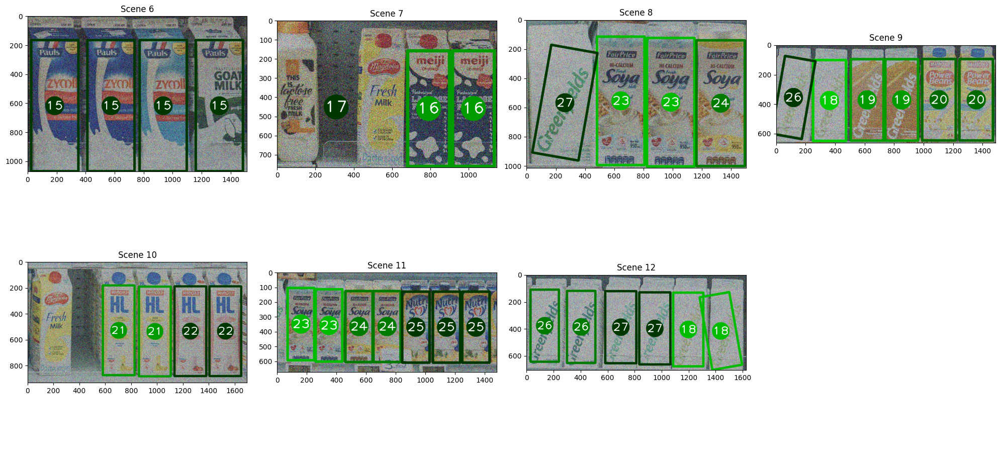

In [52]:
plot_MI_bounding_boxes(products_found_B,useNoisyScenes=True)

### Rotation and scale Invariance check

In [46]:
!gdown 1MiomLIdT8jPXpnJqV4BWlzDo55VCg7bL

Downloading...
From: https://drive.google.com/uc?id=1MiomLIdT8jPXpnJqV4BWlzDo55VCg7bL
To: /home/davide/Desktop/AI/IPCV/assignments/IPCV-assignments/part_one/scene13.png
100%|██████████████████████████████████████| 7.00M/7.00M [00:00<00:00, 9.96MB/s]


In [ ]:
scene_image=cv2.imread('./scene13.png')
sift = cv2.SIFT_create(**sift_settings)
keypoints_scene = sift.detect(scene_image)
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(cv2.drawKeypoints(scene_image,keypoints_scene,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS),cv2.COLOR_BGR2RGB))
keypoints_scene, descriptors_scene = sift.compute(scene_image, keypoints_scene)

Perform the same computations as for earlier:

In [ ]:
results = {}
results['test']={}
DISTANCES_RATIO = 1
MIN_VOTES = 3
for j, product in enumerate(product_info_B, 15):
    # if j not in (15,): continue
    kp_scene = list(keypoints_scene).copy()
    des_scene = descriptors_scene.copy()
    print(f'Searching product {product}...')
    results['test'][j] = []
    kp_prod = product_info_B[product]['keypoints'].copy()
    des_prod = product_info_B[product]['descriptors'].copy()
    V_prod = product_info_B[product]['vectors']
    matcher = cv2.BFMatcher()
    matches = matcher.knnMatch(des_prod, des_scene, k=2)
    good = []
    for m, n in matches:
        if m.distance < DISTANCES_RATIO*n.distance:
            good.append(m)
    old_des_number = 0
    while not (des_scene.shape[0] < 1):
        matches = matcher.knnMatch(des_prod, des_scene, k=2)
        good = []
        for m, n in matches:
            if m.distance < DISTANCES_RATIO*n.distance:
                good.append(m)
        src_kp = [kp_prod[m.queryIdx] for m in good]
        src_V = [V_prod[m.queryIdx] for m in good]
        dst_kp = [kp_scene[m.trainIdx] for m in good]
        (pointx, pointy, rotation, scale), vote_count = vote_with_accumulator(
            shape=scene_image.shape,
            target_kp=dst_kp,
            template_kp=src_kp,
            joining_vectors=src_V,
            voting_window_size=9)
        if vote_count < MIN_VOTES:break
        g = extract_geometry(pointx, pointy, rotation, scale, product_info_B[product]['shape'], product_info_B[product]['barycenter'])
        old_des_number = des_scene.shape[0]
        kp_scene, des_scene = remove_used_KP_DES(kp_scene, des_scene, g)
        if des_scene.shape[0] == old_des_number: break
        results['test'][j].append({
            'vote_count': vote_count,
            'geometry': get_geometry(g, rotation, scale),
            'flag': True,
            'score': vote_count
        })

Searching product 15...
Searching product 16...
Searching product 17...
Searching product 18...
Searching product 19...
Searching product 20...
Searching product 21...
Searching product 22...
Searching product 23...
Searching product 24...
Searching product 25...
Searching product 26...
Searching product 27...


In [ ]:
display(results)

{'test': {15: [{'vote_count': 95,
    'geometry': {'position': (348, 1253),
     'height': 996,
     'width': 358,
     'corners': array([[[   9,  847]],
     
            [[ 345,  724]],
     
            [[ 686, 1660]],
     
            [[ 350, 1782]]], dtype=int64),
     'rotation': 340,
     'scale': 1.1},
    'flag': True,
    'score': 95},
   {'vote_count': 28,
    'geometry': {'position': (348, 1352),
     'height': 996,
     'width': 358,
     'corners': array([[[   9,  946]],
     
            [[ 345,  823]],
     
            [[ 686, 1759]],
     
            [[ 350, 1881]]], dtype=int64),
     'rotation': 340,
     'scale': 1.1},
    'flag': True,
    'score': 28},
   {'vote_count': 25,
    'geometry': {'position': (366, 1244),
     'height': 996,
     'width': 358,
     'corners': array([[[  27,  838]],
     
            [[ 363,  715]],
     
            [[ 704, 1651]],
     
            [[ 368, 1773]]], dtype=int64),
     'rotation': 340,
     'scale': 1.1},
    'flag': T

In [ ]:
reflag_multiple_products(results)
flag_same_products_MI(results, method=CHECK_METHOD)
products_found_B=print_multiple_instances(results,CHECK_CENTER_POSITION,True)

Scene test:
	Product 15 - 7 instance found:
		Instance 1,  votes: 95,  score: 95.0 {position: (348, 1253), width: 358px, height: 996px rotation: 340 scale: 1.1}
		Instance 2,  votes: 3,   score: 3.0 {position: (668, 880), width: 358px, height: 996px rotation: 140 scale: 1.1}
		Instance 3,  votes: 3,   score: 3.0 {position: (777, 1452), width: 390px, height: 1086px rotation: 350 scale: 1.2}
		Instance 4,  votes: 4,   score: 4.0 {position: (2306, 731), width: 358px, height: 996px rotation: 230 scale: 1.1}
		Instance 5,  votes: 3,   score: 3.0 {position: (2832, 1424), width: 358px, height: 996px rotation: 340 scale: 1.1}
		Instance 6,  votes: 5,   score: 5.0 {position: (3436, 1174), width: 358px, height: 995px rotation: 290 scale: 1.1}
		Instance 7,  votes: 4,   score: 4.0 {position: (4373, 1760), width: 324px, height: 906px rotation: 130 scale: 1.0}
	Product 17 - 2 instance found:
		Instance 1,  votes: 5,   score: 5.0 {position: (110, 796), width: 357px, height: 939px rotation: 70 scale:

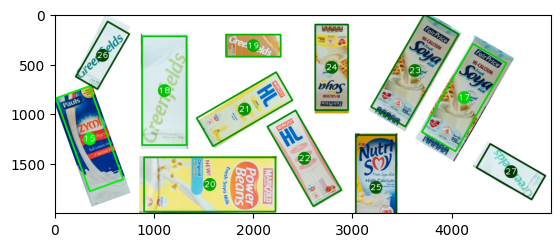

In [ ]:
colorRange=200
drawCircles=True
prods=len(results['test'].keys())
image=scene_image.copy()
for c,products in enumerate(results['test']):
    for instance in results['test'][products]:
        if instance['flag'] and instance['vote_count']>10:
            points = instance['geometry']['corners']
            color=[0,255-colorRange+colorRange*(prods-(c+1))/prods,0]
            image = cv2.polylines(image, [np.int32(points)], True, color, 15, cv2.LINE_AA)
            text=f'{products}'
            px,py=instance['geometry']['position']
            if drawCircles:
                image=cv2.circle(image,(px,py),65,color,-1)
                text_color=[255]*3
            else: 
                text_color=0
            px-=60
            py+=30
            image=cv2.putText(image,text,(px,py),cv2.FONT_HERSHEY_PLAIN,6,text_color,5)
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
if i == len(scenes_B)-1:
    for ax in axes[i+1:]:
        ax.axis('off')

As we can see the products are found even with different scales and orientations.